### References
- https://arxiv.org/pdf/1805.08318

In [1]:
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import matplotlib.pyplot as plt
import torch
from torch import nn
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
from torchvision.transforms import v2 as T
from torchvision.transforms.functional import convert_image_dtype
import torchvision.utils as vutils
import random
from tqdm import tqdm
from torch.nn.utils import spectral_norm
from torch.utils.data.dataset import random_split
from torchmetrics.image.fid import FrechetInceptionDistance

In [2]:
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
BATCH_SIZE = 64
NZ = 256                    # Размер векторра шума z
NGF = 32                    # Размер модификатора каналов в генераторе
NDF = 32                    # Размер модификатора каналов в дискриминаторе
NC = 3                      # Количество каналов в изображении
BETA_1, BETA_2 = 0, 0.9     # B1, B2 коэффициенты оптимизатора
CLASS_N = 11                # Количество классов в датасете
K = 8                       # Множитель уменьшения количества каналов в слое self-attention

In [3]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [4]:
class SelfAttention(nn.Module):
    def __init__(self, input):
        super().__init__()
        self.f = nn.Conv2d(input, input // K, 1)
        self.g = nn.Conv2d(input, input // K, 1)
        self.h = nn.Conv2d(input, input // K, 1)
        self.v = nn.Conv2d(input // K, input, 1)
        self.softmax = nn.Softmax(dim=-1)
        self.gamma = nn.Parameter(torch.zeros(1))

    def forward(self, x):
        batch, channels, width, height = x.shape
        f = self.f(x).view(batch, -1, width * height)                   # BxCxWxH -> BxCxN | N(W*H)
        f = torch.transpose(f, 1, 2)                                    # BxCxN -> BxNxC
        g = self.g(x).view(batch, -1, width * height)                   # BxCxWxH -> BxCxN
        h = self.h(x).view(batch, -1, width * height)                   # BxCxWxH -> BxCxN
        attention = self.softmax(torch.bmm(f, g))                       # BxNxC x BxCxN -> BxNxN
        attention = torch.bmm(h, attention)                             # BxCxN x BxNxN -> BxCxN
        attention = attention.view(batch, channels // K, width, height) # BxCxN -> BxCxWxH
        o = self.v(attention)
        out = x + o * self.gamma
        return out

In [5]:
class Generator(nn.Module):
    def __init__(self):
        super().__init__()
        self.l1 = nn.Sequential(
            # NZ
            spectral_norm(nn.ConvTranspose2d(NZ, NGF * 8, 8, 1, 0, bias=False)),
            nn.BatchNorm2d(NGF * 8),
            nn.ReLU(True),
        )
        self.l2 = nn.Sequential(
            # ngf*8 x 8 x 8 
            spectral_norm(nn.ConvTranspose2d(NGF * 8, NGF * 4, 4, 2, 1, bias=False)),
            nn.BatchNorm2d(NGF * 4),
            nn.ReLU(True),
        )
        self.l3 = nn.Sequential(
            # ngf*4 x 16 x 16
            spectral_norm(nn.ConvTranspose2d(NGF * 4, NGF * 2, 4, 2, 1, bias=False)),
            nn.BatchNorm2d(NGF * 2),
            nn.ReLU(True),
        )
        self.l4 = nn.Sequential(
            # ngf*2 x 32 x 32
            spectral_norm(nn.ConvTranspose2d(NGF * 2, NGF , 4, 2, 1, bias=False)),
            nn.BatchNorm2d(NGF),
            nn.ReLU(True)
        )
        self.l5 = nn.Sequential(
            # ngf x 64 x 64
            nn.ConvTranspose2d(NGF, NC, 4, 2, 1, bias=False),
            nn.Tanh(),
        )
        self.att = SelfAttention(NGF* 8)

    def forward(self, x, rnd=0.005):
        x = self.l1(x)
        x = self.att(x)
        x = self.l2(x)
        x = self.l3(x)
        x = self.l4(x)
        x = self.l5(x)
        noise = (rnd**0.5)*torch.randn(x.shape, device=DEVICE).detach()
        return x + noise

class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.l1 = nn.Sequential(
            # nc x 128 x 128
            spectral_norm(nn.Conv2d(NC, NDF, 4, 2, 1, bias=False)),
            nn.BatchNorm2d(NDF),
            nn.LeakyReLU(0.2, inplace=True),
        )
        self.l2 = nn.Sequential(
            # ndf x 64 x 64
            spectral_norm(nn.Conv2d(NDF, NDF * 2, 4, 2, 1, bias=False)),
            nn.BatchNorm2d(NDF * 2),
            nn.LeakyReLU(0.2, inplace=True),
        )
        self.l3 = nn.Sequential(
            # ndf*2 x 32 x 32
            spectral_norm(nn.Conv2d(NDF * 2, NDF * 4, 4, 2, 1, bias=False)),
            nn.BatchNorm2d(NDF * 4),
            nn.LeakyReLU(0.2, inplace=True),
        )
        self.l4 = nn.Sequential(
            # ndf*4 x 16 x 16
            spectral_norm(nn.Conv2d(NDF * 4, NDF * 8, 4, 2, 1, bias=False)),
            nn.BatchNorm2d(NDF * 8),
            nn.LeakyReLU(0.2, inplace=True),
        )
        self.image_classification = nn.Sequential(
            nn.Conv2d(NDF * 8, CLASS_N, 8, 1, 0, bias=False),
            nn.Sigmoid()
        )
        self.fake_classification = nn.Sequential(
            nn.Conv2d(NDF * 8, 1, 8, 1, 0, bias=False),
        )
        self.att = SelfAttention(NDF*8)

    def forward(self, x):
        x = self.l1(x)
        x = self.l2(x)
        x = self.l3(x)
        x = self.l4(x)
        x = self.att(x)
        fake = self.fake_classification(x)
        label = self.image_classification(x)
        return fake, label

In [6]:
def train(models, data_loader: DataLoader, optimizers: tuple, class_loss_fn, rnd=0.005):
    D, G = models
    G.train()
    D.train()

    d_optim, g_optim = optimizers
    train_d_loss, train_g_loss = 0, 0

    for real_img, class_label in data_loader:
        real_img, class_label = real_img.to(DEVICE), class_label.to(DEVICE)
        batch_size = real_img.size(0)

        fake_img = G(torch.randn(batch_size, NZ, 1, 1, device=DEVICE), rnd)

        # добавляем шум в входные данные
        real_img = real_img + (rnd**0.5)*torch.randn(real_img.shape, device=DEVICE).detach()
       
        # тренируем дискриминатор
        d_optim.zero_grad()
        # реальные изображения
        true_outs, label = D(real_img)
        d_real_loss = torch.nn.ReLU()(1.0 - true_outs).mean()
        d_real_loss = d_real_loss + class_loss_fn(label.squeeze(2, 3), class_label)
        d_real_loss.backward()

        # фейковые изображения
        fake_outs, _ = D(fake_img.detach())
        d_fake_loss = torch.nn.ReLU()(1.0 + fake_outs).mean()
        d_fake_loss.backward()  
        d_optim.step()
        
        # тренируем генератор
        g_optim.zero_grad()
        fake_outs_, _ = D(fake_img)
        g_loss = -fake_outs_.mean()
        g_loss.backward()
        g_optim.step()

        train_d_loss += (d_real_loss + d_fake_loss).item()
        train_g_loss += g_loss.item()

    train_g_loss /= len(data_loader)
    train_d_loss /= len(data_loader)

    return train_d_loss, train_g_loss

In [7]:
@torch.no_grad()
def eval(model, data_loader, fid):
    G = model
    G.to(DEVICE)
    G.eval()

    for real_img, _ in data_loader:
        real_img = real_img.to(DEVICE)
        batch_size = real_img.size(0)
        fake_img = G(torch.randn(batch_size, NZ, 1, 1, device=DEVICE))

        fid.update(convert_image_dtype(real_img.clamp(0, 1), torch.uint8), real=True)
        fid.update(convert_image_dtype(fake_img.clamp(0, 1), torch.uint8), real=False)

    score = fid.compute()
    fid.reset()
    return score

In [8]:
image_dataset = ImageFolder(
    root='planets',
    transform=T.Compose([
        T.Resize(128),
        T.ToTensor()
    ]))

train_data , eval_data = random_split(image_dataset, (int(len(image_dataset) * 0.8), len(image_dataset) - int(len(image_dataset) * 0.8)))
data_loader = torch.utils.data.DataLoader(train_data, batch_size=BATCH_SIZE, shuffle=True)
eval_data_loader = torch.utils.data.DataLoader(eval_data, batch_size=BATCH_SIZE, shuffle=True)

In [9]:
G = Generator()
D = Discriminator()

G.apply(weights_init)
D.apply(weights_init)

G.to(DEVICE)
D.to(DEVICE)

g_optim = torch.optim.Adam(G.parameters(), lr=2e-4, betas=(BETA_1, BETA_2))
d_optim = torch.optim.Adam(D.parameters(), lr=6e-4, betas=(BETA_1, BETA_2))
class_loss_fn = nn.CrossEntropyLoss()
fid = FrechetInceptionDistance(feature=2048, reset_real_features=False).to(DEVICE)

In [10]:
fix_noise = torch.randn(16, NZ, 1, 1, device=DEVICE)


def plot_examples(title=None):
    G.eval()
    D.eval()

    plt.figure(figsize=(10, 4))
    images = G(fix_noise)

    plt.imshow(np.transpose(vutils.make_grid(images.cpu().clamp(0, 1), padding=5, normalize=False), (1, 2, 0)))
    if title:
        plt.title(title)
    plt.show()

epoch:1, d loss:3.1018847227096558, g loss:7.257137760519981, fid:409.3827209472656
epoch:2, d loss:2.394369257820977, g loss:8.613447904586792, fid:390.50286865234375
epoch:3, d loss:2.7963696817557016, g loss:7.179924971527523, fid:369.02587890625
epoch:4, d loss:3.345782710446252, g loss:5.801257542437977, fid:287.437744140625
epoch:5, d loss:3.2489440706041126, g loss:4.874478453563319, fid:258.9572448730469
epoch:6, d loss:3.251767529381646, g loss:3.8922267100877233, fid:254.9774932861328
epoch:7, d loss:3.245675186316172, g loss:3.254982036848863, fid:249.60255432128906
epoch:8, d loss:3.165593296289444, g loss:3.567100353021589, fid:254.07064819335938
epoch:9, d loss:3.070093870162964, g loss:3.4551683175894947, fid:248.9796142578125
epoch:10, d loss:2.748086647854911, g loss:3.8235670460595026, fid:243.41128540039062
epoch:11, d loss:2.6561838885148368, g loss:3.862832713458273, fid:226.99681091308594
epoch:12, d loss:2.7887176838186054, g loss:3.8810258019301624, fid:226.9262

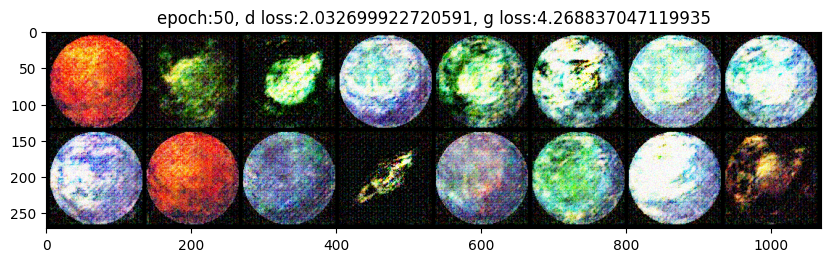

epoch:51, d loss:2.0839405755201974, g loss:4.388123139739037, fid:212.97332763671875
epoch:52, d loss:2.099489390850067, g loss:4.490953377551502, fid:209.4866180419922
epoch:53, d loss:2.1365024546782174, g loss:4.286938389142354, fid:195.5884552001953
epoch:54, d loss:2.1323861446645527, g loss:4.249291663368543, fid:209.175537109375
epoch:55, d loss:1.9578702085547977, g loss:4.576171113385095, fid:216.86277770996094
epoch:56, d loss:1.9948554933071136, g loss:4.614075859387715, fid:216.83709716796875
epoch:57, d loss:2.0309244063165455, g loss:4.631688601440853, fid:215.99951171875
epoch:58, d loss:1.9886222183704376, g loss:4.600728475385242, fid:212.36732482910156
epoch:59, d loss:1.912460873524348, g loss:4.570745802587933, fid:213.9328155517578
epoch:60, d loss:2.007027546564738, g loss:4.683186818328169, fid:201.19546508789062
epoch:61, d loss:1.8571084174844954, g loss:4.599717954794566, fid:217.08802795410156
epoch:62, d loss:2.1040621399879456, g loss:4.530871462490824, fi

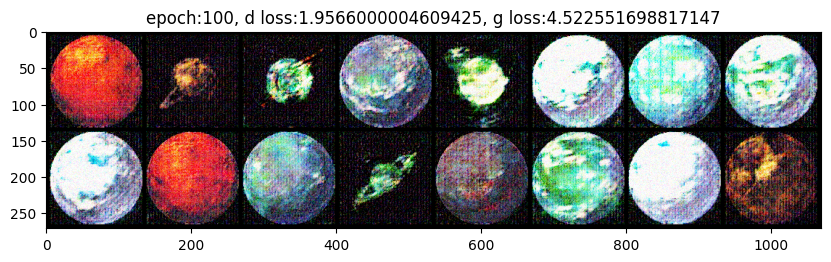

epoch:101, d loss:2.0736444062656827, g loss:4.501353606581688, fid:208.73876953125
epoch:102, d loss:1.9104433920648363, g loss:4.581762810548146, fid:198.06407165527344
epoch:103, d loss:1.979377269744873, g loss:4.506634674966335, fid:197.90081787109375
epoch:104, d loss:1.8598469462659624, g loss:4.538012590673235, fid:190.96856689453125
epoch:105, d loss:1.9152677191628351, g loss:4.7430508765909405, fid:193.15252685546875
epoch:106, d loss:1.9145886103312175, g loss:4.612727406952116, fid:198.7325439453125
epoch:107, d loss:1.963469535112381, g loss:4.545038277904193, fid:192.7447967529297
epoch:108, d loss:1.8259043329291873, g loss:4.535655836264293, fid:197.1773223876953
epoch:109, d loss:2.0369849503040314, g loss:4.525831142233478, fid:198.80426025390625
epoch:110, d loss:1.9423199660248227, g loss:4.384242898888058, fid:201.85601806640625
epoch:111, d loss:1.9873386290338304, g loss:4.4865512152512865, fid:194.83128356933594
epoch:112, d loss:1.9300132526291742, g loss:4.32

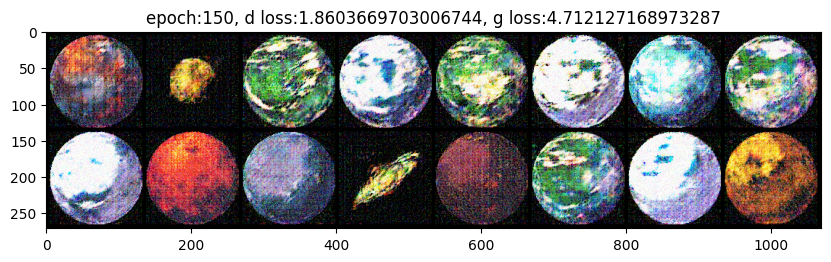

epoch:151, d loss:1.8967893951468997, g loss:4.633630183007982, fid:190.82899475097656
epoch:152, d loss:1.8110220796532102, g loss:4.561017347706689, fid:184.78306579589844
epoch:153, d loss:1.8653136160638597, g loss:4.7731601397196455, fid:191.51882934570312
epoch:154, d loss:1.8314512140221066, g loss:4.600363102224138, fid:192.3391876220703
epoch:155, d loss:1.9081314669715033, g loss:4.641438781387276, fid:190.37442016601562
epoch:156, d loss:1.851348684893714, g loss:4.801537162727779, fid:185.0462646484375
epoch:157, d loss:1.9987954133086734, g loss:4.7195282015535565, fid:189.460205078125
epoch:158, d loss:1.8016443947951, g loss:4.670462972588009, fid:193.28038024902344
epoch:159, d loss:1.8455530206362407, g loss:4.623887466059791, fid:183.25955200195312
epoch:160, d loss:1.8468106985092163, g loss:4.7213254736529455, fid:176.3237762451172
epoch:161, d loss:1.8685255249341328, g loss:4.711923635668224, fid:190.21080017089844
epoch:162, d loss:1.8913245565361447, g loss:4.71

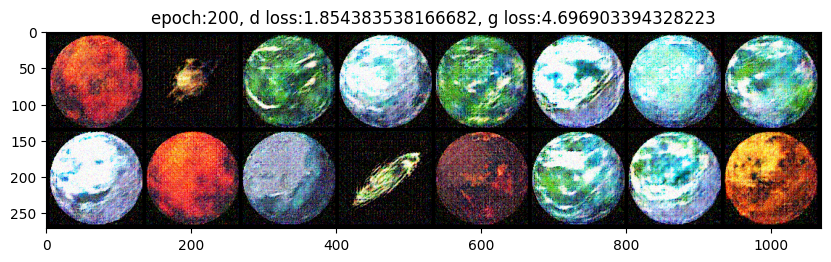

epoch:201, d loss:1.9086270564132266, g loss:4.590562144915263, fid:184.49310302734375
epoch:202, d loss:1.8081230256292555, g loss:4.600163565741645, fid:180.95347595214844
epoch:203, d loss:1.7973310384485457, g loss:4.688026424911287, fid:186.57803344726562
epoch:204, d loss:1.8384671211242676, g loss:4.517589963144726, fid:179.5479278564453
epoch:205, d loss:1.8528848157988653, g loss:4.705578631824917, fid:175.3726348876953
epoch:206, d loss:1.9352878663274977, g loss:4.5687215816643505, fid:179.8320770263672
epoch:207, d loss:1.8747674988375769, g loss:4.552974197599623, fid:189.49655151367188
epoch:208, d loss:1.8791797127988603, g loss:4.612227916717529, fid:186.9589385986328
epoch:209, d loss:1.8766187296973333, g loss:4.698706623580721, fid:190.83383178710938
epoch:210, d loss:1.8144365383519068, g loss:4.743799169858296, fid:182.1485595703125
epoch:211, d loss:1.8611735436651442, g loss:4.639847401115629, fid:182.79664611816406
epoch:212, d loss:1.8246403005388048, g loss:4.

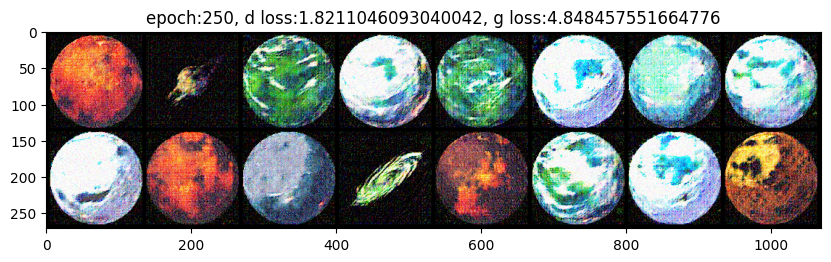

epoch:251, d loss:1.8276570207542844, g loss:4.84986870487531, fid:181.49041748046875
epoch:252, d loss:1.8597063852681055, g loss:4.60872028933631, fid:184.7991180419922
epoch:253, d loss:1.809776312775082, g loss:4.753044247627258, fid:189.74085998535156
epoch:254, d loss:1.8253059188524883, g loss:4.797725955645244, fid:182.0972137451172
epoch:255, d loss:1.801390379667282, g loss:4.75323901573817, fid:182.5127716064453
epoch:256, d loss:1.8306093414624531, g loss:4.788948323991564, fid:175.3218231201172
epoch:257, d loss:1.8840210669570499, g loss:4.717924303478664, fid:184.76849365234375
epoch:258, d loss:1.8870098392168682, g loss:4.682590319050683, fid:177.31756591796875
epoch:259, d loss:1.8301695419682398, g loss:4.788640356726116, fid:173.84556579589844
epoch:260, d loss:1.835411313507292, g loss:4.72028261423111, fid:185.44119262695312
epoch:261, d loss:1.7846465276347265, g loss:4.884710139698452, fid:170.58978271484375
epoch:262, d loss:1.8512354724937015, g loss:4.7280212

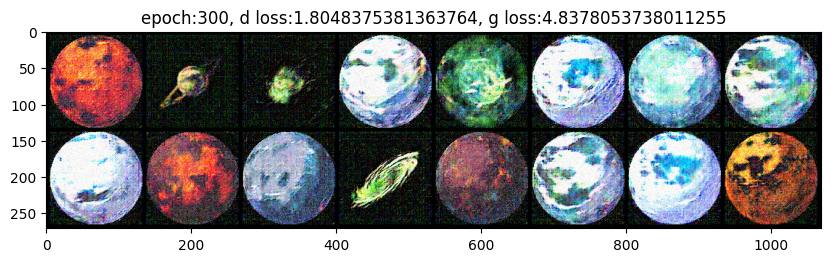

epoch:301, d loss:1.8396315740214453, g loss:5.112355556752947, fid:178.67572021484375
epoch:302, d loss:1.7951895263459947, g loss:4.830644985040029, fid:180.5321044921875
epoch:303, d loss:1.7762459748321109, g loss:4.993979295094808, fid:169.9555206298828
epoch:304, d loss:1.8544714152812958, g loss:5.012503431902991, fid:188.56277465820312
epoch:305, d loss:1.7599485284752316, g loss:4.9621924426820545, fid:177.2953338623047
epoch:306, d loss:1.8178172409534454, g loss:5.101421462164985, fid:182.6722412109375
epoch:307, d loss:1.7295574214723375, g loss:5.052147620254093, fid:177.09156799316406
epoch:308, d loss:1.7940695484479268, g loss:5.185044977400038, fid:173.6092071533203
epoch:309, d loss:1.7477166950702667, g loss:5.0803827908304005, fid:181.3087158203125
epoch:310, d loss:1.8029421899053786, g loss:4.837172544664806, fid:178.43753051757812
epoch:311, d loss:1.7995093729760911, g loss:5.071264717313978, fid:174.73297119140625
epoch:312, d loss:1.8139466875129275, g loss:4.

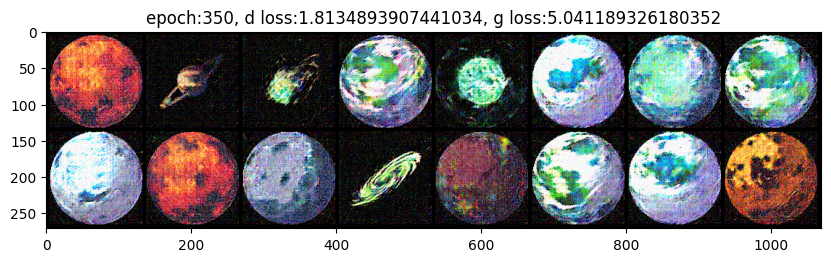

epoch:351, d loss:1.7879555887646146, g loss:5.215112811989254, fid:177.26625061035156
epoch:352, d loss:1.7814202937814925, g loss:5.048554225100411, fid:170.2330780029297
epoch:353, d loss:1.7933168974187639, g loss:5.017277340094249, fid:173.45057678222656
epoch:354, d loss:1.793752885527081, g loss:5.0274644295374555, fid:177.01365661621094
epoch:355, d loss:1.8234980669286516, g loss:4.983314818806118, fid:173.19097900390625
epoch:356, d loss:1.7653130922052596, g loss:4.898680124017927, fid:172.24191284179688
epoch:357, d loss:1.7790999081399705, g loss:5.022599932220247, fid:180.49932861328125
epoch:358, d loss:1.7864194876617856, g loss:4.905638029177983, fid:168.1267547607422
epoch:359, d loss:1.7620371712578669, g loss:5.08372469080819, fid:181.5858154296875
epoch:360, d loss:1.8024510277642145, g loss:5.016785343488057, fid:185.04563903808594
epoch:361, d loss:1.815164138873418, g loss:5.079303999741872, fid:187.3164520263672
epoch:362, d loss:1.8300164110130734, g loss:4.91

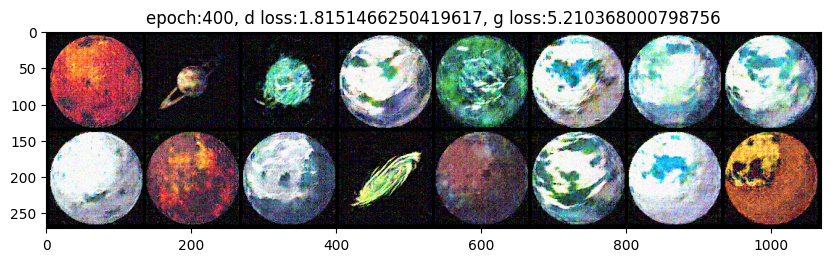

epoch:401, d loss:1.7526056501600478, g loss:5.099392778343624, fid:174.31942749023438
epoch:402, d loss:1.7677583760685391, g loss:5.012776169512007, fid:174.00576782226562
epoch:403, d loss:1.799668894873725, g loss:5.16103662053744, fid:173.2158660888672
epoch:404, d loss:1.7816340956423018, g loss:4.993048038747576, fid:170.142578125
epoch:405, d loss:1.7406790653864543, g loss:5.09535104698605, fid:173.66172790527344
epoch:406, d loss:1.7594478726387024, g loss:4.969309548536937, fid:180.48936462402344
epoch:407, d loss:1.7754744920465682, g loss:5.18689857588874, fid:177.5491180419922
epoch:408, d loss:1.7982531090577443, g loss:5.154738363292482, fid:171.58621215820312
epoch:409, d loss:1.7775814798143175, g loss:5.183795938889186, fid:168.8953094482422
epoch:410, d loss:1.7421776817904577, g loss:5.086330006519954, fid:186.5660858154297
epoch:411, d loss:1.7903995513916016, g loss:4.982171555360158, fid:170.99465942382812
epoch:412, d loss:1.7639200223816767, g loss:4.900569038

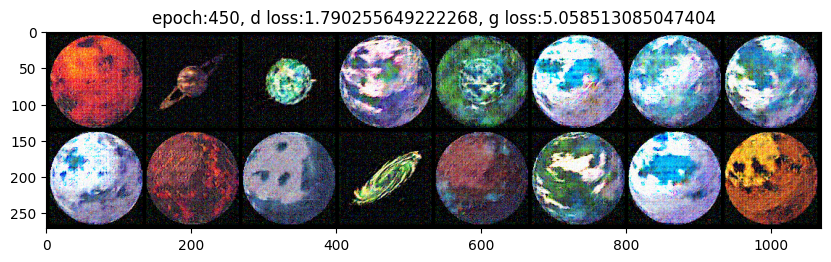

epoch:451, d loss:1.7276940908696916, g loss:5.2684253917800055, fid:172.6029052734375
epoch:452, d loss:1.7089494963486989, g loss:5.387345810731252, fid:172.91770935058594
epoch:453, d loss:1.7250345547993977, g loss:5.158986171086629, fid:171.75680541992188
epoch:454, d loss:1.805577493376202, g loss:5.229973495006561, fid:171.2602996826172
epoch:455, d loss:1.8084868556923337, g loss:5.442516956064436, fid:175.30735778808594
epoch:456, d loss:1.7880755563577015, g loss:5.169125003947152, fid:177.0677032470703
epoch:457, d loss:1.7952762974633112, g loss:4.979001508818732, fid:168.96783447265625
epoch:458, d loss:1.7151071197456784, g loss:5.261198997497559, fid:168.2205810546875
epoch:459, d loss:1.7652056283420987, g loss:5.059289375940959, fid:177.49493408203125
epoch:460, d loss:1.7776203950246174, g loss:5.410017248657015, fid:169.2787322998047
epoch:461, d loss:1.7717080314954121, g loss:5.109842459360759, fid:168.15097045898438
epoch:462, d loss:1.7224445574813418, g loss:5.2

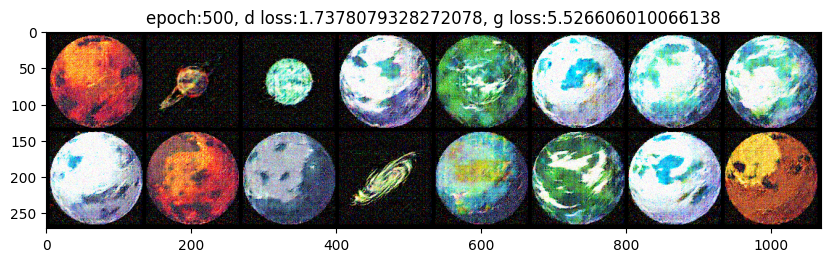

epoch:501, d loss:1.7214945819642808, g loss:5.440494431389703, fid:180.6525421142578
epoch:502, d loss:1.8413699997795954, g loss:5.266729520426856, fid:172.785400390625
epoch:503, d loss:1.6769766509532928, g loss:5.3267732461293535, fid:170.3534698486328
epoch:504, d loss:1.716681397623486, g loss:5.321818143129349, fid:174.3452911376953
epoch:505, d loss:1.7981664935747783, g loss:5.4292851487795515, fid:163.9693603515625
epoch:506, d loss:1.7602301273081038, g loss:5.326923761102888, fid:168.82472229003906
epoch:507, d loss:1.7343807253572676, g loss:5.4363336894247265, fid:170.09939575195312
epoch:508, d loss:1.8018210298485227, g loss:5.293598704867893, fid:168.56036376953125
epoch:509, d loss:1.7059654527240329, g loss:5.465214967727661, fid:174.66555786132812
epoch:510, d loss:1.7111833261118994, g loss:5.352080126603444, fid:175.58819580078125
epoch:511, d loss:1.79899087217119, g loss:5.376765290896098, fid:172.32452392578125
epoch:512, d loss:1.7297599183188543, g loss:5.41

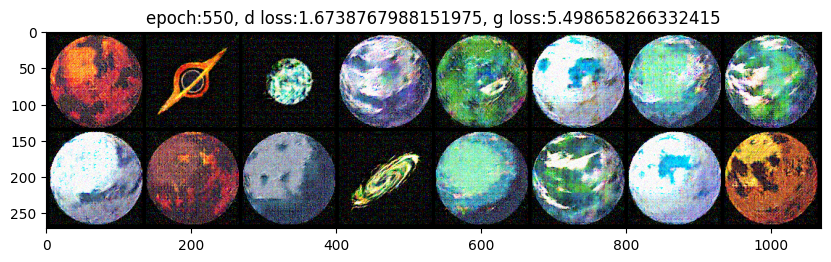

epoch:551, d loss:1.821719421280755, g loss:5.643162959151798, fid:170.08395385742188
epoch:552, d loss:1.6791329483191173, g loss:5.506834811634487, fid:173.36874389648438
epoch:553, d loss:1.743621524837282, g loss:5.5277311073409185, fid:166.01336669921875
epoch:554, d loss:1.701676007774141, g loss:5.403999229272206, fid:175.7438507080078
epoch:555, d loss:1.7576134602228801, g loss:5.602447370688121, fid:170.2605743408203
epoch:556, d loss:1.731724739074707, g loss:5.446412285168965, fid:176.1106414794922
epoch:557, d loss:1.7207026680310566, g loss:5.566780116822985, fid:172.712158203125
epoch:558, d loss:1.7194543778896332, g loss:5.329999036259121, fid:174.29757690429688
epoch:559, d loss:1.7321755687395732, g loss:5.65031702319781, fid:167.57823181152344
epoch:560, d loss:1.7869378825028737, g loss:5.707679609457652, fid:169.5841064453125
epoch:561, d loss:1.6960077616903517, g loss:5.420819448100196, fid:171.81919860839844
epoch:562, d loss:1.7081460257371266, g loss:5.357680

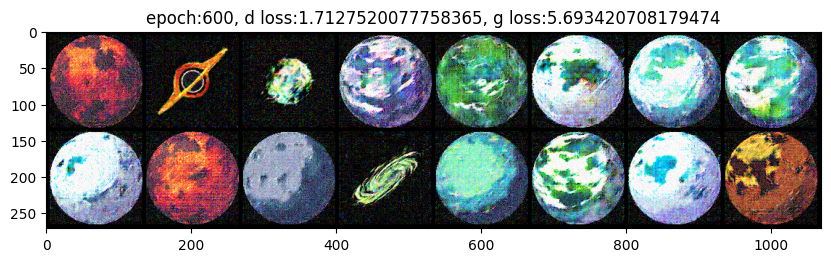

epoch:601, d loss:1.7375280459721882, g loss:5.67075600888994, fid:174.86622619628906
epoch:602, d loss:1.7224387327829997, g loss:5.616466793749067, fid:171.4556427001953
epoch:603, d loss:1.7018689314524333, g loss:5.552757051255968, fid:172.13189697265625
epoch:604, d loss:1.7257396082083385, g loss:5.615953551398383, fid:171.56871032714844
epoch:605, d loss:1.6684184438652463, g loss:5.609706785943773, fid:171.49195861816406
epoch:606, d loss:1.7172500358687506, g loss:5.539658463663525, fid:172.8477325439453
epoch:607, d loss:1.758204612467024, g loss:5.824338340097004, fid:176.845703125
epoch:608, d loss:1.6966386338075001, g loss:5.636007891760932, fid:178.48414611816406
epoch:609, d loss:1.7158621119128332, g loss:5.542974564764235, fid:174.884521484375
epoch:610, d loss:1.7415980796019237, g loss:5.99440018998252, fid:170.82131958007812
epoch:611, d loss:1.7090299725532532, g loss:5.912949118349287, fid:164.5242919921875
epoch:612, d loss:1.731778038872613, g loss:5.7056151297

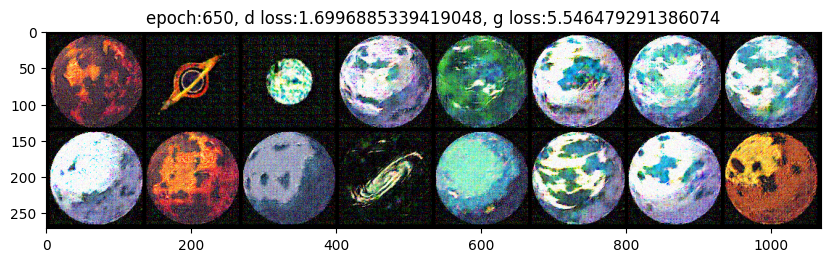

epoch:651, d loss:1.7034518950515323, g loss:5.577190021673839, fid:172.1571502685547
epoch:652, d loss:1.719164490699768, g loss:5.968910197416942, fid:174.44625854492188
epoch:653, d loss:1.7004100978374481, g loss:5.760535299777985, fid:171.1903076171875
epoch:654, d loss:1.714186539252599, g loss:5.728633595837487, fid:168.661376953125
epoch:655, d loss:1.6926740275488958, g loss:5.689860840638478, fid:169.01756286621094
epoch:656, d loss:1.7213788562350802, g loss:5.539731211132473, fid:172.40330505371094
epoch:657, d loss:1.7088555594285328, g loss:5.756640520360735, fid:167.3904571533203
epoch:658, d loss:1.720698333448834, g loss:5.934456533855862, fid:169.1572723388672
epoch:659, d loss:1.7063858939541712, g loss:5.948745025528802, fid:167.98240661621094
epoch:660, d loss:1.7098899284998577, g loss:5.558901303344303, fid:171.76686096191406
epoch:661, d loss:1.7232163548469543, g loss:5.695881485939026, fid:172.7253875732422
epoch:662, d loss:1.7075226406256359, g loss:6.016176

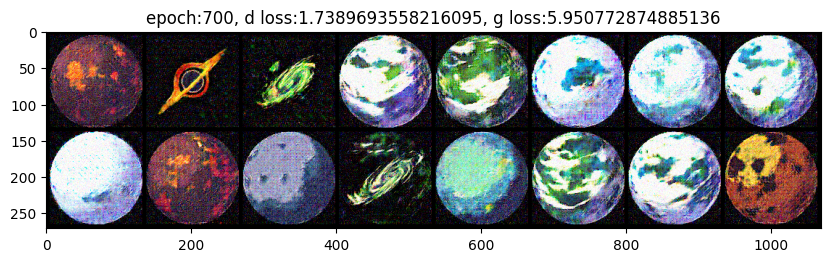

epoch:701, d loss:1.6592209703392453, g loss:5.997816198401981, fid:177.81573486328125
epoch:702, d loss:1.7096714576085408, g loss:6.0081489483515425, fid:168.77914428710938
epoch:703, d loss:1.701800008614858, g loss:5.9601975083351135, fid:163.10528564453125
epoch:704, d loss:1.698565983110004, g loss:6.037718799379137, fid:178.1611328125
epoch:705, d loss:1.7041672534412808, g loss:5.905192236105601, fid:170.57383728027344
epoch:706, d loss:1.6619857649008434, g loss:5.9805256724357605, fid:177.30201721191406
epoch:707, d loss:1.7182560960451763, g loss:5.881998221079509, fid:162.34591674804688
epoch:708, d loss:1.7216323647234175, g loss:5.9160632557339135, fid:171.08270263671875
epoch:709, d loss:1.687002529700597, g loss:5.754265586535136, fid:174.48294067382812
epoch:710, d loss:1.7314956155088213, g loss:5.933332641919454, fid:176.22117614746094
epoch:711, d loss:1.6665018796920776, g loss:5.652109636200799, fid:173.7654266357422
epoch:712, d loss:1.6795794632699754, g loss:5.

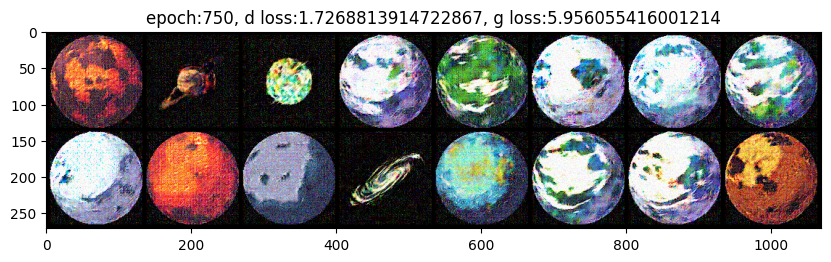

epoch:751, d loss:1.6807671156194475, g loss:5.947796093093024, fid:165.8426055908203
epoch:752, d loss:1.6785327825281355, g loss:5.944658444987403, fid:169.1094970703125
epoch:753, d loss:1.6777439415454865, g loss:5.632188783751594, fid:175.44593811035156
epoch:754, d loss:1.7366273899873097, g loss:5.876551684406069, fid:169.65223693847656
epoch:755, d loss:1.6511360936694675, g loss:5.956257803572549, fid:174.1026611328125
epoch:756, d loss:1.6876664459705353, g loss:6.130519072214763, fid:174.5298309326172
epoch:757, d loss:1.7132810089323256, g loss:5.853268212742275, fid:177.96937561035156
epoch:758, d loss:1.6917471819453769, g loss:5.962257736259037, fid:169.95423889160156
epoch:759, d loss:1.6794550948672824, g loss:5.9875755740536585, fid:177.98411560058594
epoch:760, d loss:1.7139385475052729, g loss:5.898830486668481, fid:167.62413024902344
epoch:761, d loss:1.7021316786607106, g loss:5.886057674884796, fid:169.9379425048828
epoch:762, d loss:1.720666978094313, g loss:5.5

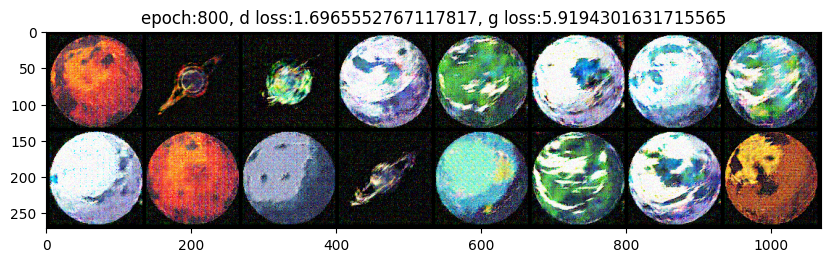

epoch:801, d loss:1.6940346724457211, g loss:6.082302596833971, fid:175.3943328857422
epoch:802, d loss:1.702869498067432, g loss:6.021105700069004, fid:174.84864807128906
epoch:803, d loss:1.6923050979773204, g loss:6.127086056603326, fid:171.658935546875
epoch:804, d loss:1.6604292690753937, g loss:6.260165499316321, fid:171.88818359375
epoch:805, d loss:1.6889343559741974, g loss:6.15297579103046, fid:170.46546936035156
epoch:806, d loss:1.6830253601074219, g loss:6.259382612175411, fid:168.1419677734375
epoch:807, d loss:1.6710167460971408, g loss:6.306163648764293, fid:173.09722900390625
epoch:808, d loss:1.6918006506231096, g loss:6.240816659397549, fid:174.15318298339844
epoch:809, d loss:1.6839765078491635, g loss:6.045839349428813, fid:165.4310760498047
epoch:810, d loss:1.6879425942897797, g loss:6.276605599456364, fid:166.4900360107422
epoch:811, d loss:1.7539973192744784, g loss:6.21578252977795, fid:170.05828857421875
epoch:812, d loss:1.6513339347309537, g loss:6.06210807

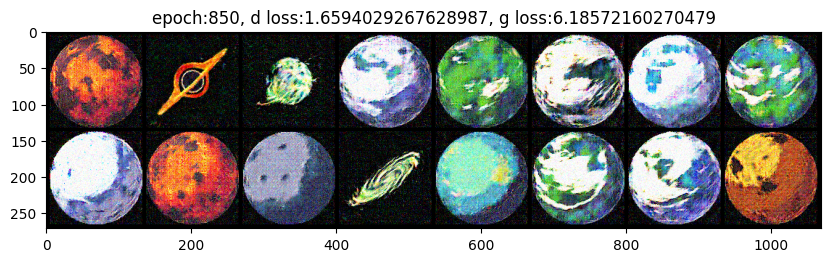

epoch:851, d loss:1.655714448955324, g loss:6.258953928947449, fid:166.99574279785156
epoch:852, d loss:1.7253999908765156, g loss:6.30970737669203, fid:165.141357421875
epoch:853, d loss:1.6647030942969852, g loss:6.344605849848853, fid:164.7916717529297
epoch:854, d loss:1.6627712845802307, g loss:5.89903109603458, fid:176.06565856933594
epoch:855, d loss:1.6987239850891962, g loss:6.600396758980221, fid:164.6511993408203
epoch:856, d loss:1.6952417691548665, g loss:6.234637664424048, fid:169.4080810546875
epoch:857, d loss:1.6923398938443925, g loss:6.402880509694417, fid:169.51431274414062
epoch:858, d loss:1.658993704451455, g loss:6.40710875723097, fid:171.3969268798828
epoch:859, d loss:1.6850827236970265, g loss:6.245753010114034, fid:165.1722869873047
epoch:860, d loss:1.6787097818321652, g loss:6.373240252335866, fid:168.68197631835938
epoch:861, d loss:1.6815124286545649, g loss:6.238012664847904, fid:168.32559204101562
epoch:862, d loss:1.693522526158227, g loss:6.152942724

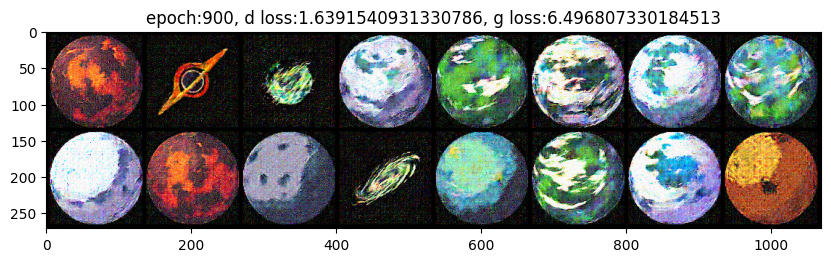

epoch:901, d loss:1.6688286595874362, g loss:6.069773508442773, fid:167.06942749023438
epoch:902, d loss:1.6319999893506367, g loss:6.272219949298435, fid:171.40203857421875
epoch:903, d loss:1.7076612876521216, g loss:6.299401329623328, fid:164.2991943359375
epoch:904, d loss:1.6871427065796323, g loss:6.557471983962589, fid:170.4243621826172
epoch:905, d loss:1.649593131409751, g loss:6.1811292966206866, fid:161.21701049804688
epoch:906, d loss:1.681541469362047, g loss:6.241119629806942, fid:165.49574279785156
epoch:907, d loss:1.6680306361781225, g loss:6.036375284194946, fid:161.6636962890625
epoch:908, d loss:1.7115538385179307, g loss:5.948204275634554, fid:169.2877960205078
epoch:909, d loss:1.6734728515148163, g loss:6.26704544491238, fid:165.9521484375
epoch:910, d loss:1.637040141555998, g loss:6.337424000104268, fid:175.427490234375
epoch:911, d loss:1.7053708268536463, g loss:6.368529213799371, fid:174.4597625732422
epoch:912, d loss:1.6846747232808008, g loss:6.3084279033

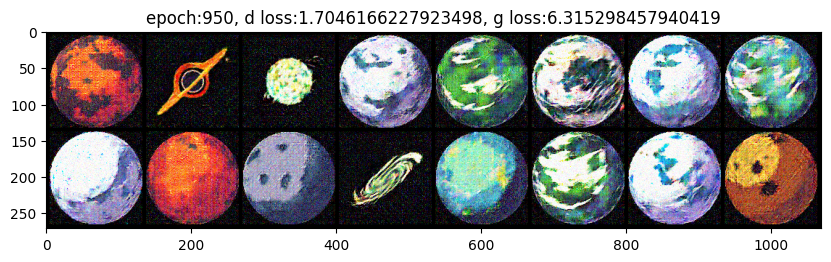

epoch:951, d loss:1.7128454082541995, g loss:6.562250230047438, fid:173.40786743164062
epoch:952, d loss:1.6425759262508817, g loss:5.98123746448093, fid:169.2437286376953
epoch:953, d loss:1.6507428387800853, g loss:6.416676263014476, fid:177.2207794189453
epoch:954, d loss:1.7011727723810408, g loss:6.5549969342019825, fid:176.58580017089844
epoch:955, d loss:1.7022647261619568, g loss:6.3264047967063055, fid:170.25360107421875
epoch:956, d loss:1.6697983245054882, g loss:6.413260387049781, fid:161.60829162597656
epoch:957, d loss:1.6878981192906697, g loss:6.548914160993364, fid:172.1444091796875
epoch:958, d loss:1.669848362604777, g loss:6.2951126959588795, fid:175.85040283203125
epoch:959, d loss:1.6515053311983745, g loss:6.319964951939053, fid:171.54061889648438
epoch:960, d loss:1.6522325078646343, g loss:6.085004548231761, fid:165.72764587402344
epoch:961, d loss:1.6809300482273102, g loss:6.450497600767347, fid:170.83079528808594
epoch:962, d loss:1.6380828155411615, g loss:

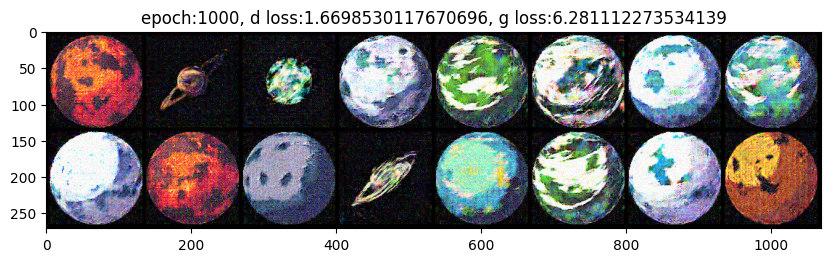

epoch:1001, d loss:1.678140189912584, g loss:6.463452140490214, fid:169.48167419433594
epoch:1002, d loss:1.6278774605857, g loss:6.56924585501353, fid:170.328857421875
epoch:1003, d loss:1.7254122959242926, g loss:6.235184139675564, fid:173.2008514404297
epoch:1004, d loss:1.6972675952646468, g loss:6.176943361759186, fid:172.15927124023438
epoch:1005, d loss:1.628976537121667, g loss:6.294838190078735, fid:174.00946044921875
epoch:1006, d loss:1.654437694284651, g loss:6.521461738480462, fid:168.61630249023438
epoch:1007, d loss:1.676121711730957, g loss:6.442982170316908, fid:171.96856689453125
epoch:1008, d loss:1.6129444042841594, g loss:6.149622314506107, fid:165.19265747070312
epoch:1009, d loss:1.6588126685884264, g loss:6.443880849414402, fid:170.61843872070312
epoch:1010, d loss:1.6924246417151556, g loss:6.353803628020817, fid:169.82223510742188
epoch:1011, d loss:1.720253027147717, g loss:6.265204654799567, fid:165.83770751953125
epoch:1012, d loss:1.621045880847507, g loss

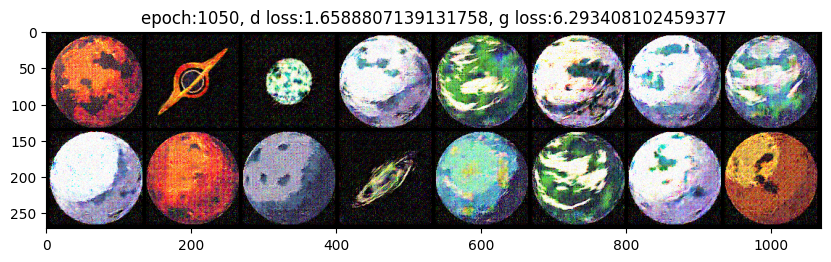

epoch:1051, d loss:1.7143020199404821, g loss:6.3952346377902565, fid:170.05743408203125
epoch:1052, d loss:1.6359128687116835, g loss:6.678672737545437, fid:164.97665405273438
epoch:1053, d loss:1.6283942096763186, g loss:6.52673038509157, fid:165.64678955078125
epoch:1054, d loss:1.6802726984024048, g loss:6.555919680330488, fid:167.25912475585938
epoch:1055, d loss:1.6320976052019331, g loss:6.320936560630798, fid:171.65823364257812
epoch:1056, d loss:1.7104164825545416, g loss:6.4858545660972595, fid:169.0883331298828
epoch:1057, d loss:1.5892549090915256, g loss:6.516123407416874, fid:168.6549530029297
epoch:1058, d loss:1.6692475643422868, g loss:6.701260566711426, fid:167.8376007080078
epoch:1059, d loss:1.6437595552868314, g loss:6.789468831486172, fid:167.24929809570312
epoch:1060, d loss:1.6256404254171584, g loss:6.579091509183248, fid:161.9760284423828
epoch:1061, d loss:1.6976992355452643, g loss:6.594214035405053, fid:159.99009704589844
epoch:1062, d loss:1.66127462188402

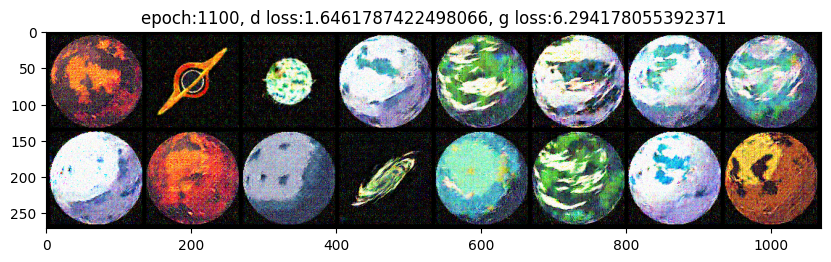

epoch:1101, d loss:1.6555188960499234, g loss:6.518420146571265, fid:170.025634765625
epoch:1102, d loss:1.6842776106463537, g loss:6.434210525618659, fid:167.21363830566406
epoch:1103, d loss:1.647999687327279, g loss:6.370638900332981, fid:175.36056518554688
epoch:1104, d loss:1.649413549237781, g loss:6.68712259001202, fid:168.9363555908203
epoch:1105, d loss:1.648361815346612, g loss:6.7541204823387995, fid:166.33602905273438
epoch:1106, d loss:1.629385617044237, g loss:6.4846081203884545, fid:172.403076171875
epoch:1107, d loss:1.649048775434494, g loss:6.5712818834516735, fid:173.69000244140625
epoch:1108, d loss:1.6321241458257039, g loss:6.703576491938697, fid:167.9962615966797
epoch:1109, d loss:1.6459725399812062, g loss:6.688733094268375, fid:168.79727172851562
epoch:1110, d loss:1.6320709453688726, g loss:6.677554998132917, fid:168.2304229736328
epoch:1111, d loss:1.6335630814234416, g loss:6.94104931751887, fid:163.67929077148438
epoch:1112, d loss:1.6777033938301935, g lo

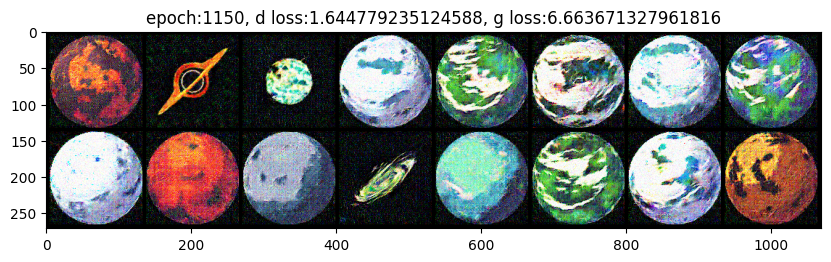

epoch:1151, d loss:1.6458754705058203, g loss:6.580067276954651, fid:172.2653350830078
epoch:1152, d loss:1.651578575372696, g loss:6.629859420988295, fid:162.49932861328125
epoch:1153, d loss:1.6521791418393452, g loss:6.44661960999171, fid:164.6112518310547
epoch:1154, d loss:1.701712389787038, g loss:6.688423322306739, fid:163.05935668945312
epoch:1155, d loss:1.6503952476713393, g loss:6.836923493279351, fid:172.54217529296875
epoch:1156, d loss:1.6318924228350322, g loss:6.660221325026618, fid:177.80300903320312
epoch:1157, d loss:1.6699347959624395, g loss:6.93252416451772, fid:175.2035369873047
epoch:1158, d loss:1.6234003669685788, g loss:6.743085788355933, fid:171.04769897460938
epoch:1159, d loss:1.6447279784414504, g loss:6.6624304917123585, fid:166.38125610351562
epoch:1160, d loss:1.645419951942232, g loss:6.851216872533162, fid:167.8181610107422
epoch:1161, d loss:1.6307500733269586, g loss:6.524951113594903, fid:166.5947723388672
epoch:1162, d loss:1.6277428732977972, g 

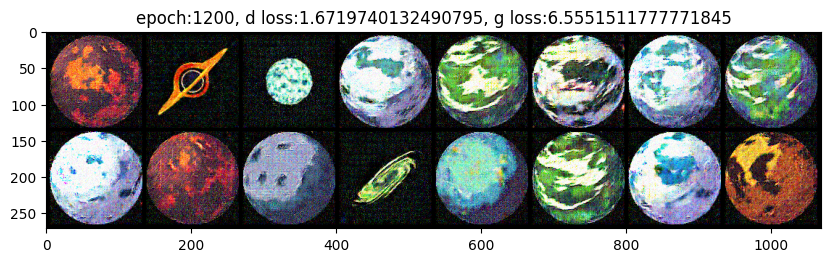

epoch:1201, d loss:1.6821524500846863, g loss:6.337429761886597, fid:169.51177978515625
epoch:1202, d loss:1.6048411296473608, g loss:6.979673730002509, fid:177.92098999023438
epoch:1203, d loss:1.6632192300425634, g loss:6.645812213420868, fid:172.9163360595703
epoch:1204, d loss:1.6419345769617293, g loss:6.935690310266283, fid:173.56199645996094
epoch:1205, d loss:1.5996196700467005, g loss:6.856780979368422, fid:177.19955444335938
epoch:1206, d loss:1.7059227128823597, g loss:6.892227967580159, fid:177.66976928710938
epoch:1207, d loss:1.6697728236516316, g loss:6.755918655130598, fid:167.21197509765625
epoch:1208, d loss:1.6315359473228455, g loss:6.745756593015459, fid:172.97438049316406
epoch:1209, d loss:1.6868420276376936, g loss:6.739619579580095, fid:168.44638061523438
epoch:1210, d loss:1.6311670409308539, g loss:6.643482393688625, fid:162.82528686523438
epoch:1211, d loss:1.6443705757459004, g loss:6.742574347390069, fid:165.7855682373047
epoch:1212, d loss:1.6244926618205

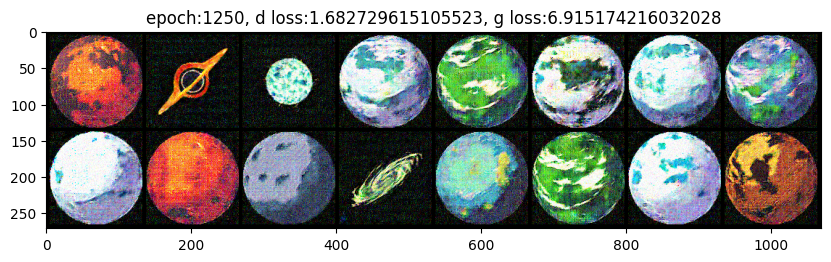

epoch:1251, d loss:1.622143715620041, g loss:6.938747564951579, fid:174.04779052734375
epoch:1252, d loss:1.6273587478531732, g loss:7.090007901191711, fid:171.39462280273438
epoch:1253, d loss:1.6644664307435353, g loss:6.8533321089214745, fid:172.95999145507812
epoch:1254, d loss:1.678251412179735, g loss:6.90568032529619, fid:169.93576049804688
epoch:1255, d loss:1.6533075173695881, g loss:6.82451934284634, fid:168.93508911132812
epoch:1256, d loss:1.6385744843218062, g loss:6.926041119628483, fid:174.68128967285156
epoch:1257, d loss:1.6599254541926913, g loss:6.898089256551531, fid:167.884033203125
epoch:1258, d loss:1.6269516514407263, g loss:6.618106577131483, fid:167.8710479736328
epoch:1259, d loss:1.6309720277786255, g loss:6.953852891921997, fid:169.3488311767578
epoch:1260, d loss:1.6206128431691065, g loss:6.783317069212596, fid:165.89767456054688
epoch:1261, d loss:1.6839600503444672, g loss:6.842931270599365, fid:172.51026916503906
epoch:1262, d loss:1.6329454183578491, 

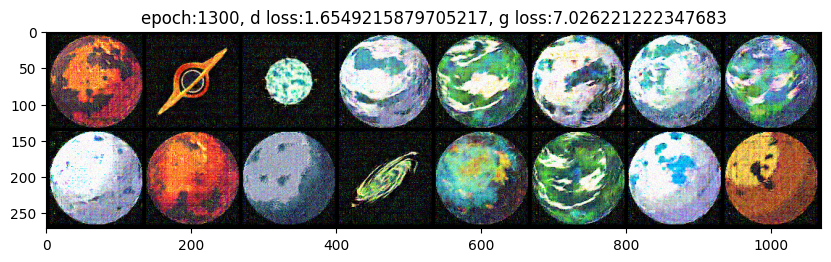

epoch:1301, d loss:1.6442072523964777, g loss:6.92775907781389, fid:166.7017822265625
epoch:1302, d loss:1.6615130702654521, g loss:6.760216474533081, fid:166.73423767089844
epoch:1303, d loss:1.620191799269782, g loss:6.590013636483087, fid:161.631103515625
epoch:1304, d loss:1.6618226634131537, g loss:6.661863283978568, fid:163.67822265625
epoch:1305, d loss:1.6084607773356967, g loss:6.83096973101298, fid:171.1314239501953
epoch:1306, d loss:1.6609463724825118, g loss:6.748248875141144, fid:164.4248809814453
epoch:1307, d loss:1.6354975269900427, g loss:7.084621747334798, fid:166.9497528076172
epoch:1308, d loss:1.6607172787189484, g loss:6.95626605881585, fid:160.32810974121094
epoch:1309, d loss:1.6636445025602977, g loss:7.182326992352803, fid:157.74728393554688
epoch:1310, d loss:1.7123971945709653, g loss:7.11266236172782, fid:165.42025756835938
epoch:1311, d loss:1.6264621482955084, g loss:7.061506364080641, fid:164.353271484375
epoch:1312, d loss:1.6552689903312259, g loss:6.

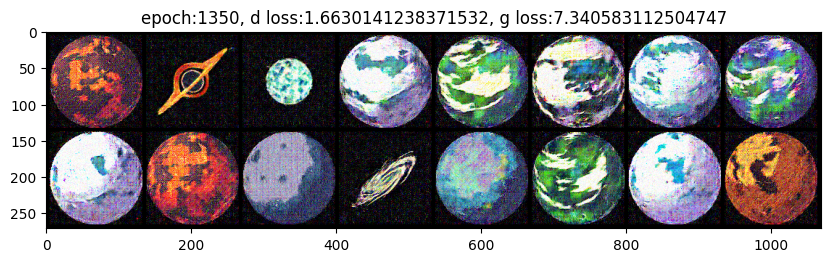

epoch:1351, d loss:1.6544882092210982, g loss:7.163502620326148, fid:169.5574951171875
epoch:1352, d loss:1.681951681772868, g loss:6.778638005256653, fid:168.0171356201172
epoch:1353, d loss:1.6066159572866228, g loss:7.0289572609795465, fid:160.7248992919922
epoch:1354, d loss:1.6579667727152507, g loss:6.759338994820912, fid:170.47598266601562
epoch:1355, d loss:1.6238314741187625, g loss:6.710147460301717, fid:162.6860809326172
epoch:1356, d loss:1.63336005475786, g loss:7.096133351325989, fid:161.6505584716797
epoch:1357, d loss:1.647794375816981, g loss:6.798336174752977, fid:159.4848175048828
epoch:1358, d loss:1.7026149696773953, g loss:6.811321026749081, fid:163.01100158691406
epoch:1359, d loss:1.5907158454259236, g loss:6.580418003929986, fid:166.03627014160156
epoch:1360, d loss:1.657187561194102, g loss:6.8908341195848255, fid:170.7860107421875
epoch:1361, d loss:1.6677053272724152, g loss:6.648661315441132, fid:169.0501251220703
epoch:1362, d loss:1.6564108166429732, g lo

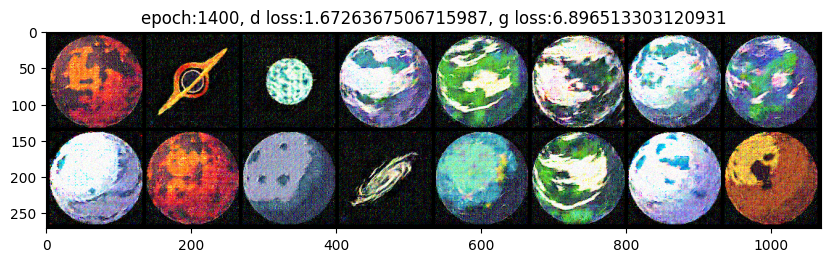

epoch:1401, d loss:1.6175933182239532, g loss:7.223717212677002, fid:170.2759246826172
epoch:1402, d loss:1.6284742289119296, g loss:7.170999341540867, fid:168.31039428710938
epoch:1403, d loss:1.6142302354176838, g loss:7.111398544576433, fid:170.838623046875
epoch:1404, d loss:1.648539059691959, g loss:6.8870050642225475, fid:167.23057556152344
epoch:1405, d loss:1.6499987377060785, g loss:7.589190509584215, fid:165.72027587890625
epoch:1406, d loss:1.618268092473348, g loss:7.072301414277819, fid:167.9764404296875
epoch:1407, d loss:1.6305011808872223, g loss:6.896425233946906, fid:166.66783142089844
epoch:1408, d loss:1.6248106327321794, g loss:7.0873545739385815, fid:169.9539794921875
epoch:1409, d loss:1.6516339812013838, g loss:7.032224608792199, fid:175.6638641357422
epoch:1410, d loss:1.6537088718679216, g loss:7.097676144705878, fid:166.1565704345703
epoch:1411, d loss:1.664888984627194, g loss:6.9777493543095055, fid:162.2227020263672
epoch:1412, d loss:1.5770039558410645, g

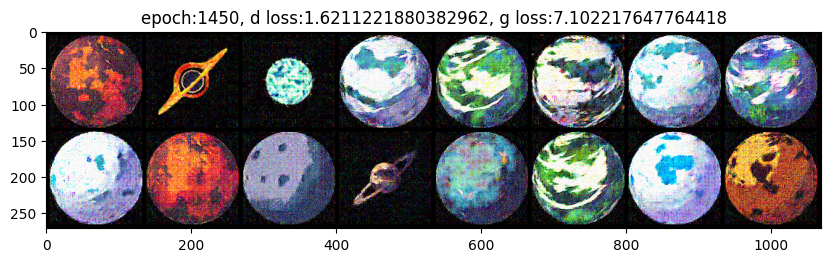

epoch:1451, d loss:1.6687189638614655, g loss:6.898009028699663, fid:164.4528045654297
epoch:1452, d loss:1.6292632685767279, g loss:6.911359045240614, fid:160.00543212890625
epoch:1453, d loss:1.6257874038484361, g loss:7.164515323109097, fid:163.343505859375
epoch:1454, d loss:1.6703047917948828, g loss:6.822445975409614, fid:167.4328155517578
epoch:1455, d loss:1.6549058556556702, g loss:6.849027997917599, fid:163.6013641357422
epoch:1456, d loss:1.652899142768648, g loss:7.260854880015056, fid:160.98211669921875
epoch:1457, d loss:1.58615619275305, g loss:7.014184488190545, fid:172.48468017578125
epoch:1458, d loss:1.6331841746966045, g loss:6.938872032695347, fid:163.68502807617188
epoch:1459, d loss:1.6849742896027036, g loss:7.113010618421766, fid:164.81044006347656
epoch:1460, d loss:1.6225774188836415, g loss:6.948313938246833, fid:162.7071533203125
epoch:1461, d loss:1.656876004404492, g loss:7.078889575269487, fid:171.7705535888672
epoch:1462, d loss:1.619558377398385, g los

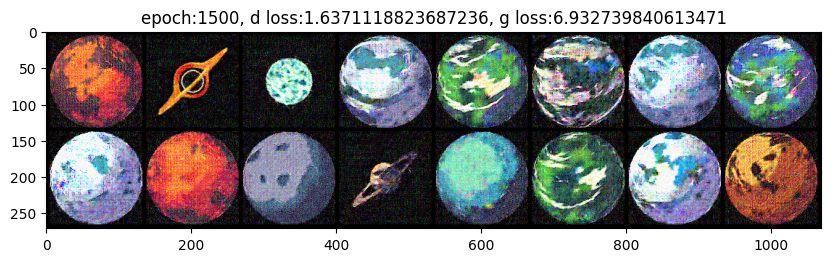

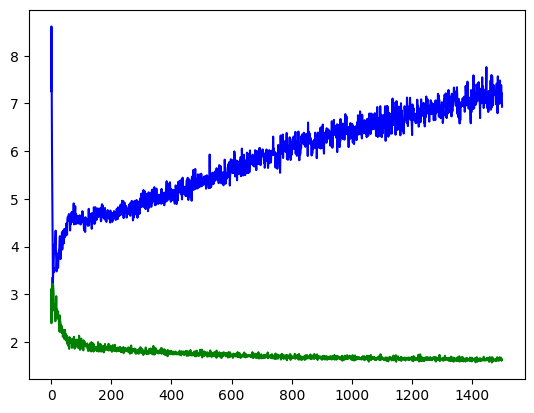

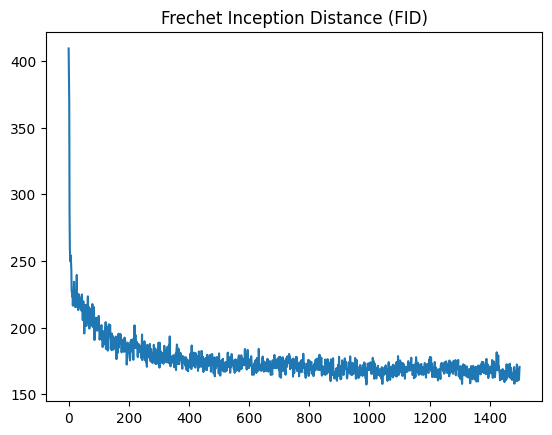

In [11]:
all_d_loss, all_g_loss, all_fid_score = [], [], []

rnd = random.uniform(0, 0.5)
for e in range(1, 1501):
    d_loss, g_loss= train((D, G), data_loader, (d_optim, g_optim), class_loss_fn, rnd)
    all_d_loss.append(d_loss)
    all_g_loss.append(g_loss)

    fid_score = eval(G, eval_data_loader, fid)
    all_fid_score.append(fid_score.cpu())

    print(f'epoch:{e}, d loss:{d_loss}, g loss:{g_loss}, fid:{fid_score}')
    if e % 50 == 0:
        plot_examples(f'epoch:{e}, d loss:{d_loss}, g loss:{g_loss}')

plt.plot(all_d_loss, color='green')
plt.plot(all_g_loss, color='blue')
plt.show()

plt.plot(all_fid_score)
plt.title('Frechet Inception Distance (FID)')
plt.show()

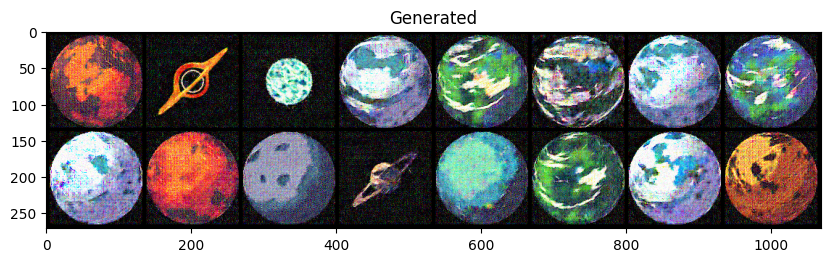

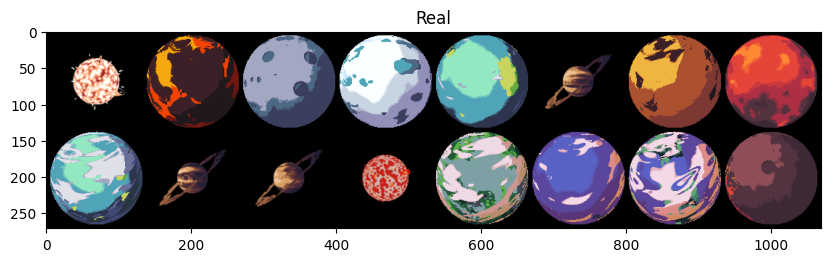

In [12]:
plot_examples('Generated')
plt.figure(figsize=(10, 4))
plt.imshow(np.transpose(vutils.make_grid(next(iter(data_loader))[0][:16], padding=5, normalize=True), (1, 2, 0)))
plt.title('Real')
plt.show()